In [24]:
import pandas as pd
import simfin as sf
import numpy as np
import scipy as sp
import datetime as date
from datetime import datetime
from simfin.names import *
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as scst

In [25]:
sf.set_api_key('PLEbHyzQgm98TrvHFejzBwikq1mKiJob ')
sf.set_data_dir('~/simfin_data/')

In [26]:
#collect data from api
fig_rat = sf.load_derived(variant = 'quarterly',market = 'us')
sec_ind = sf.load_industries()
comps = sf.load_companies(market='us')


Dataset "us-derived-quarterly" on disk (29 days old).
- Loading from disk ... Done!
Dataset "industries" on disk (29 days old).
- Loading from disk ... Done!
Dataset "us-companies" on disk (29 days old).
- Loading from disk ... Done!


In [27]:
hist_price = sf.load_shareprices(variant = 'daily', market = 'us')
price_rat = sf.load_derived_shareprices(variant='daily', market='us')

Dataset "us-shareprices-daily" on disk (29 days old).
- Loading from disk ... Done!
Dataset "us-derived-shareprices-daily" on disk (29 days old).
- Loading from disk ... Done!


In [28]:
#Pre-process historic fundamentals data
fig_rat.head()
cp_figrat = fig_rat.reset_index()
cp_figrat = cp_figrat[['Report Date','SimFinId','Free Cash Flow','Liabilities to Equity Ratio']]
cp_prat = price_rat.reset_index()
cp_prat = cp_prat[['Ticker','Date','SimFinId','Price to Earnings Ratio (quarterly)','Price to Book Value','EV/EBITDA']]
ftest = pd.merge(cp_figrat,cp_prat,how = 'left', left_on=['SimFinId','Report Date'], right_on=['SimFinId','Date'])
ftest = ftest.set_index('SimFinId')
tick_id = cp_prat[['Ticker','SimFinId']]
tick_id = pd.DataFrame([tick_id.Ticker.unique(),tick_id.SimFinId.unique()])
tick_id = tick_id.transpose()
tick_id.columns= ['Ticker','SimFinId']
tick_id = tick_id.set_index('SimFinId')

In [29]:
#fill historic fundamentals
hist_fund = {}
count = 0
for idx,i in ftest.iterrows():
    if idx not in hist_fund.keys(): 
        hist_fund[idx] = {}
    hist_fund[idx][i['Report Date']] = i.drop(['Ticker','Date'])
    if idx in tick_id.index:
        hist_fund[idx]['Ticker'] = tick_id.loc[idx]['Ticker']


In [30]:
hist_price_copy = hist_price
hist_price_copy = hist_price_copy.reset_index()
ticker_list = list(set(hist_price_copy['Ticker']))
ticker_list.sort()

In [31]:
hPrice = hist_price_copy[['SimFinId','Ticker','Date','Open','Low','High','Close']]
t_days = list(set(hPrice.Date))
t_days.sort()
prices_dict = {};
p_open = hPrice.pivot_table(index=['Date'], values = 'Open',columns = 'Ticker')
p_close = hPrice.pivot_table(index=['Date'], values = 'Close',columns = 'Ticker')
p_high = hPrice.pivot_table(index=['Date'], values = 'High',columns = 'Ticker')
p_low = hPrice.pivot_table(index=['Date'], values = 'Low',columns = 'Ticker')
#structure return data as dictionary
prices_dict['open'] = p_open
prices_dict['close']= p_close
prices_dict['high']= p_high
prices_dict['low']= p_low

In [32]:
#daily open price
p_open = prices_dict['open']
p_open.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3442 entries, 2007-01-03 to 2020-09-02
Columns: 2160 entries, A to low
dtypes: float64(2160)
memory usage: 56.7 MB


In [33]:
daily_tick = {};

In [34]:
#base code to simulate weights.
def port_sim(w, capital):
    for index,i in p_open_ret.iterrows():
        t_temp = p_open_ret.dropna(axis=1)
        print(t_temp)
        w_temp = w[index]
        p_temp = i
        curr_port = w_temp * p_temp;
        capital = sum(curr_port)
        

In [35]:
#store open_daily_ret, cleaned.
open_daily_ret = prices_dict['open'].pct_change().fillna(0)
close_daily_ret = prices_dict['close'].pct_change().fillna(0)


In [36]:
stockstats = open_daily_ret.describe()

In [37]:
hist_fund

{989057: {Timestamp('2018-06-30 00:00:00'): Report Date                            2018-06-30 00:00:00
  Free Cash Flow                                  -4.786e+06
  Liabilities to Equity Ratio                        1.48122
  Price to Earnings Ratio (quarterly)                    NaN
  Price to Book Value                                    NaN
  EV/EBITDA                                              NaN
  Name: 989057, dtype: object,
  Timestamp('2018-09-30 00:00:00'): Report Date                            2018-09-30 00:00:00
  Free Cash Flow                                  -8.024e+06
  Liabilities to Equity Ratio                        1.54666
  Price to Earnings Ratio (quarterly)                    NaN
  Price to Book Value                                    NaN
  EV/EBITDA                                              NaN
  Name: 989057, dtype: object,
  Timestamp('2018-12-31 00:00:00'): Report Date                            2018-12-31 00:00:00
  Free Cash Flow                   

In [38]:
#EDA

#2160 stock's daily returns for 3442 trading days.
print(open_daily_ret.shape)
print(open_daily_ret.columns)

ret_stats = open_daily_ret.describe()
ret_stats.head()

(3442, 2160)
Index(['A', 'AA', 'AAC', 'AAL', 'AAMC', 'AAME', 'AAN', 'AAOI', 'AAON', 'AAP',
       ...
       'ZIOP', 'ZM', 'ZNGA', 'ZS', 'ZTS', 'ZUMZ', 'ZVO', 'ZYNE', 'ZYXI',
       'low'],
      dtype='object', name='Ticker', length=2160)


Ticker,A,AA,AAC,AAL,AAMC,AAME,AAN,AAOI,AAON,AAP,...,ZIOP,ZM,ZNGA,ZS,ZTS,ZUMZ,ZVO,ZYNE,ZYXI,low
count,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,...,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000
mean,0.000508,0.000039,-0.000526,0.000637,0.001422,0.001271,0.000703,0.000538,0.001016,0.000664,...,0.001204,0.000682,0.000256,0.000665,0.000540,0.000759,0.000468,0.000431,0.008483,0.000696
std,0.019846,0.017796,0.034646,0.046878,0.053112,0.053310,0.026998,0.031514,0.025394,0.021717,...,0.053733,0.016146,0.024675,0.017150,0.011327,0.039550,0.037819,0.043333,0.128015,0.020377
min,-0.277305,-0.153169,-0.359561,-0.302667,-0.325032,-0.333333,-0.264731,-0.232102,-0.178381,-0.147293,...,-0.606996,-0.132872,-0.383065,-0.206433,-0.100501,-0.497320,-0.347368,-0.525669,-0.689320,-0.140269
25%,-0.008344,0.000000,0.000000,-0.018183,-0.003462,-0.018182,-0.011162,-0.001360,-0.012003,-0.009118,...,-0.026245,0.000000,-0.005694,0.000000,-0.000323,-0.017857,-0.012732,0.000000,-0.033140,-0.008819


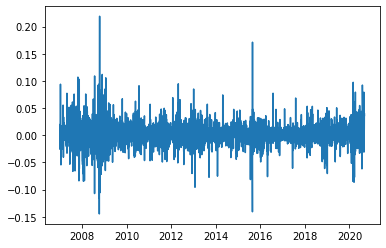

In [39]:
#check one of the returns
plt.plot(open_daily_ret['AAPL'])
#expected characteristics, stationary.

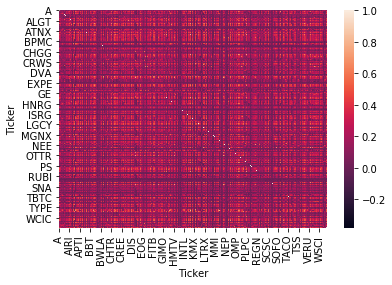

In [40]:
sns.heatmap(open_daily_ret.corr())

In [41]:
tOpen_ret = open_daily_ret.reset_index().transpose()
tClose_ret = close_daily_ret.reset_index().transpose()
tOpen_ret = tOpen_ret.reset_index()
tClose_ret = tClose_ret.reset_index()

In [42]:
tOpen_ret

,Ticker,0,1,2,3,4,5,6,7,8,...,3432,3433,3434,3435,3436,3437,3438,3439,3440,3441
0,Date,2007-01-03 00:00:00,2007-01-04 00:00:00,2007-01-05 00:00:00,2007-01-08 00:00:00,2007-01-09 00:00:00,2007-01-10 00:00:00,2007-01-11 00:00:00,2007-01-12 00:00:00,2007-01-16 00:00:00,...,2020-08-20 00:00:00,2020-08-21 00:00:00,2020-08-24 00:00:00,2020-08-25 00:00:00,2020-08-26 00:00:00,2020-08-27 00:00:00,2020-08-28 00:00:00,2020-08-31 00:00:00,2020-09-01 00:00:00,2020-09-02 00:00:00
1,A,0,-0.0197199,0,-0.00932945,0.00294291,-0.00117371,0,-0.0108696,-0.004752,...,0.0226819,0.00492864,0.00929805,-0.00921239,0.00316747,0.0102872,-0.00191552,0.00909091,0.0102102,0.000792707
2,AA,0,0,0,0,0,0,0,0,0,...,0.0162162,-0.00864362,-0.00402414,0.0181818,-0.00198413,0.00861498,-0.0137976,0.0146569,-0.0387393,0.00614754
3,AAC,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,AAL,0,0.0447207,0.0449378,-0.0260071,0.0373473,0.00992598,-0.0141596,0.0341332,-0.00637255,...,-0.0213439,0.00484653,0,0.100482,-0.0423667,0.0244088,0.0119136,0.000735835,-0.0544118,0.00622084
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2156,ZUMZ,0,0.0734501,0.0185185,0.00770416,0.00764526,0.0230653,0.0456838,-0.0198582,0.0387844,...,-0.0386534,-0.000864678,0.0203375,0.0402884,0.0301671,0.0368025,0.029771,-0.0270571,-0.0293333,0.0490581
2157,ZVO,0,0,0,0,0,0,0,0,0,...,-0.0474453,-0.0613027,-0.0285714,-0.052521,0.0243902,-0.00649351,-0.00217865,-0.00655022,-0.0373626,0.109589
2158,ZYNE,0,0,0,0,0,0,0,0,0,...,-0.00516796,-0.00779221,-0.0314136,-0.0324324,0.075419,-0.0155844,0.00791557,0,-0.0078534,0.00263852
2159,ZYXI,0,0,-0.0384615,0.28,0,-0.21875,0,-0.08,0.304348,...,-0.0104938,0.0386775,-0.0168168,-0.0592547,0.0038961,0.00582147,-0.0366559,-0.0153538,0.0020339,-0.0324763


In [43]:
#transpose to join price wtih industry/sector table
tOpen_ret.columns = tOpen_ret.iloc[0]
tClose_ret.columns = tClose_ret.iloc[0]
tOpen_ret = tOpen_ret.drop(0,axis=0)
tClose_ret = tClose_ret.drop(0,axis=0)
tOpen_ret =tOpen_ret.rename({'Date': 'Ticker'},axis=1)
tClose_ret = tClose_ret.rename({'Date': 'Ticker'},axis=1)
tOpen_ret['Ticker'] = tOpen_ret['Ticker'].astype(str)
tClose_ret['Ticker'] = tClose_ret['Ticker'].astype(str)
tOpen_ret = tOpen_ret.set_index('Ticker')
tClose_ret = tClose_ret.set_index('Ticker')


In [44]:
#im going to try to sort the stocks by industry
comps['IndustryId'] = comps['IndustryId'].fillna(0).astype(int)
#sec_ind = sec_ind.set_index('IndustryId')
comps_sec = comps.join(sec_ind[['Sector','Industry']],on='IndustryId')
comps_sec = comps_sec.reset_index()
comps_sec = comps_sec.set_index('SimFinId')
comps_sec['Ticker'] = comps_sec['Ticker'].astype(str)
comps_op = comps_sec.join(tOpen_ret,on="Ticker")
comps_op = comps_op[comps_op['IndustryId']!=0]
comps_cl = comps_sec.join(tClose_ret,on="Ticker")
comps_cl = comps_cl[comps_cl['IndustryId']!=0]
comps_op = comps_op.sort_values(by="Sector")
comps_cl = comps_cl.sort_values(by="Sector")
comps_op = comps_op.set_index("Ticker")
comps_cl = comps_cl.set_index("Ticker")

In [54]:
sorted_ret = comps_op.iloc[:,4:].transpose()
ticker_sorted = sorted_ret.columns

In [65]:
corr_sorted = sorted_ret.astype(float).corr()

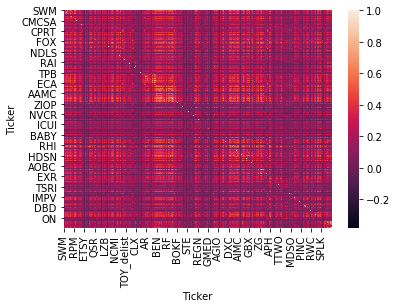

In [66]:
sns.heatmap(corr_sorted)

In [64]:
print(sorted_ret.astype(float).corr())

Ticker       SWM       FCX      GPRE        OC       HUN      BCPC       ECL  \
Ticker                                                                         
SWM     1.000000  0.320304  0.128491  0.349037  0.290898  0.392195  0.387726   
FCX     0.320304  1.000000  0.213279  0.409761  0.461002  0.359893  0.470087   
GPRE    0.128491  0.213279  1.000000  0.186079  0.186969  0.154987  0.163031   
OC      0.349037  0.409761  0.186079  1.000000  0.406773  0.338679  0.411674   
HUN     0.290898  0.461002  0.186969  0.406773  1.000000  0.335557  0.354491   
...          ...       ...       ...       ...       ...       ...       ...   
NEE     0.288865  0.305977  0.097635  0.279441  0.214520  0.313435  0.470500   
IDA     0.352178  0.276392  0.125250  0.323452  0.247414  0.404769  0.469712   
AEE     0.283899  0.264717  0.095658  0.277162  0.210923  0.329560  0.415322   
HTM     0.140448  0.161604  0.078798  0.147766  0.119289  0.145237  0.143050   
EIX     0.260921  0.291335  0.093746  0.

In [68]:
sorted_ret.describe()

Ticker,SWM,FCX,GPRE,OC,HUN,BCPC,ECL,GRA,AGI,WLB,...,LG,CMS,XEL,CPN,NWE,NEE,IDA,AEE,HTM,EIX
count,3442.0,3442.0,3442.0,3442.0,3442.0,3442.0,3442.0,3442.0,3442.0,3442.0,...,0,3442.0,3442.0,3442.0,3442.0,3442.0,3442.0,3442.0,3442.0,3442.0
unique,3378.0,3380.0,3240.0,3399.0,3351.0,3407.0,3413.0,3413.0,2740.0,2725.0,...,0,3351.0,3358.0,2414.0,3136.0,3411.0,3400.0,3381.0,1742.0,3406.0
top,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
freq,42.0,28.0,86.0,25.0,39.0,22.0,16.0,19.0,592.0,639.0,...,NaN,51.0,49.0,962.0,288.0,23.0,29.0,38.0,877.0,24.0


In [81]:
mean_daily_ret = ret_stats.iloc[1,:]
mean_daily_ret

Ticker
A       0.000508
AA      0.000039
AAC    -0.000526
AAL     0.000637
AAMC    0.001422
          ...   
ZUMZ    0.000759
ZVO     0.000468
ZYNE    0.000431
ZYXI    0.008483
low     0.000696
Name: mean, Length: 2160, dtype: float64

In [86]:
list(mean_daily_ret.index)

['A',
 'AA',
 'AAC',
 'AAL',
 'AAMC',
 'AAME',
 'AAN',
 'AAOI',
 'AAON',
 'AAP',
 'AAPL',
 'AAWW',
 'AAXN',
 'AB',
 'ABAX',
 'ABBV',
 'ABC',
 'ABCB',
 'ABCD',
 'ABG',
 'ABM',
 'ABMC',
 'ABMD',
 'ABT',
 'AC',
 'ACA',
 'ACAD',
 'ACAT',
 'ACCO',
 'ACET',
 'ACF',
 'ACGL',
 'ACHC',
 'ACIA',
 'ACLS',
 'ACLZ',
 'ACM',
 'ACN',
 'ACRX',
 'ACT',
 'ACW',
 'ACY',
 'ADBE',
 'ADES',
 'ADI',
 'ADIL',
 'ADM',
 'ADMA',
 'ADNT',
 'ADP',
 'ADPT',
 'ADRO',
 'ADS',
 'ADSK',
 'ADT',
 'ADVM',
 'AE',
 'AEE',
 'AEHR',
 'AEIS',
 'AEO',
 'AEP',
 'AEPI',
 'AES',
 'AET',
 'AFG',
 'AFI',
 'AFL',
 'AGCO',
 'AGI',
 'AGIO',
 'AGLE',
 'AGN',
 'AGNC',
 'AGN_old',
 'AGO',
 'AGR',
 'AGX',
 'AGYS',
 'AHPI',
 'AHS',
 'AIG',
 'AIMC',
 'AIR',
 'AIRI',
 'AIT',
 'AIZ',
 'AJBI',
 'AJG',
 'AJRD',
 'AJX',
 'AKAM',
 'AKER',
 'AKR',
 'AKRX',
 'AKS',
 'AL',
 'ALB',
 'ALCO',
 'ALE',
 'ALEX',
 'ALG',
 'ALGN',
 'ALGT',
 'ALJ',
 'ALJJ',
 'ALK',
 'ALKS',
 'ALL',
 'ALLE',
 'ALNY',
 'ALOT',
 'ALPN',
 'ALR',
 'ALRM',
 'ALRN',
 'ALSK',
 'ALSN

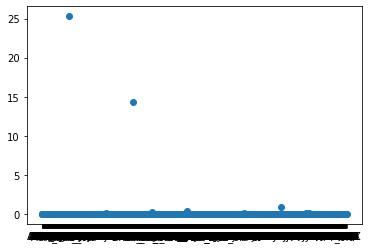

In [89]:
plt.scatter(list(mean_daily_ret.index),mean_daily_ret)

In [91]:
#interesting, there are a couple stocks that is such differs too much from the rest
max(mean_daily_ret)

25.288101800021355

In [95]:
mean_daily_ret[mean_daily_ret == max(mean_daily_ret)]

Ticker
ARS    25.288102
Name: mean, dtype: float64